# Data Analysis

In [17]:
# System libs
import os, csv, torch, numpy, scipy.io, PIL.Image, torchvision.transforms
# Our libs
from mit_semseg.models import ModelBuilder, SegmentationModule
from mit_semseg.utils import colorEncode

colors = scipy.io.loadmat('data/color150.mat')['colors']
names = {}
with open('data/object150_info.csv') as f:
    reader = csv.reader(f)
    next(reader)
    for row in reader:
        names[int(row[0])] = row[5].split(";")[0]
        
def get_class(index):
    return names[index+1]

def visualize_result(img, pred, index=None):
    # filter prediction class if requested
    if index is not None:
        pred = pred.copy()
        pred[pred != index] = -1
        print(f'{names[index+1]}:')
        
    # colorize prediction
    pred_color = colorEncode(pred, colors).astype(numpy.uint8)

    # aggregate images and save
    im_vis = numpy.concatenate((img, pred_color), axis=1)
    display(PIL.Image.fromarray(im_vis))

In [35]:
data_path = '/host/Mask_RCNN/dataset/images/user-collections/'
results_path = '/host/Mask_RCNN/dataset/classified/'
file_names =  os.listdir(test_data)
files = [os.path.join(data_path, f) for f in os.listdir(test_data)]
results = [os.path.join(results_path, f) for f in os.listdir(results_path)]

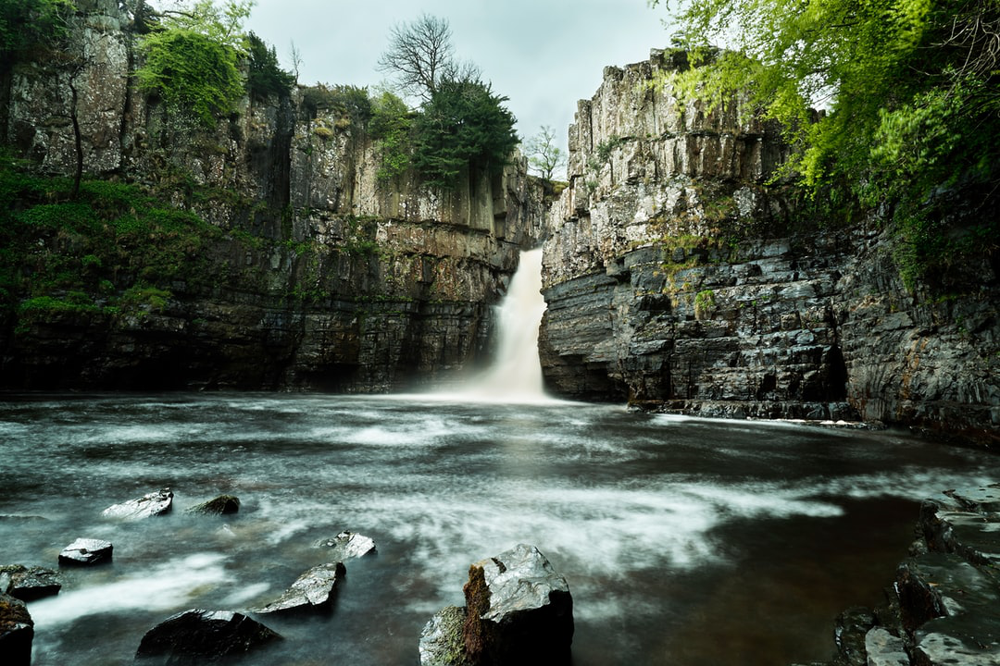

In [10]:
from PIL import Image
im = Image.open(files[0])
display(im)

In [24]:
result = numpy.load(os.path.join(results_path, '3ekBUCuauR8.npy'))

In [25]:
result

array([[ 4,  4,  4, ...,  4,  4,  4],
       [ 4,  4,  4, ...,  4,  4,  4],
       [ 4,  4,  4, ...,  4,  4,  4],
       ...,
       [34, 34, 34, ..., 21, 21, 21],
       [34, 34, 34, ..., 21, 21, 21],
       [34, 34, 34, ..., 21, 21, 21]])

In [26]:
result.shape

(720, 1080)

In [55]:
pred = result
predicted_classes = numpy.bincount(pred.flatten()).argsort()[::-1]
for c in predicted_classes[:15]:
    print(get_class(c))

water
tree
rock
sky
mountain
wall
waterfall
building
road
house
stairs
plant
river
earth
sink


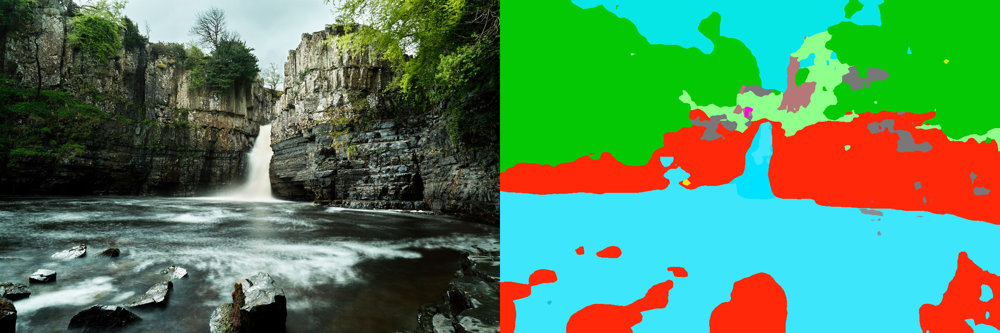

In [162]:
num = 0
pred = numpy.load(os.path.join(results_path, file_names[num] + '.npy'))
pil_image = PIL.Image.open(files[num]).convert('RGB')
img_original = numpy.array(pil_image)
visualize_result(img_original, pred)

water:


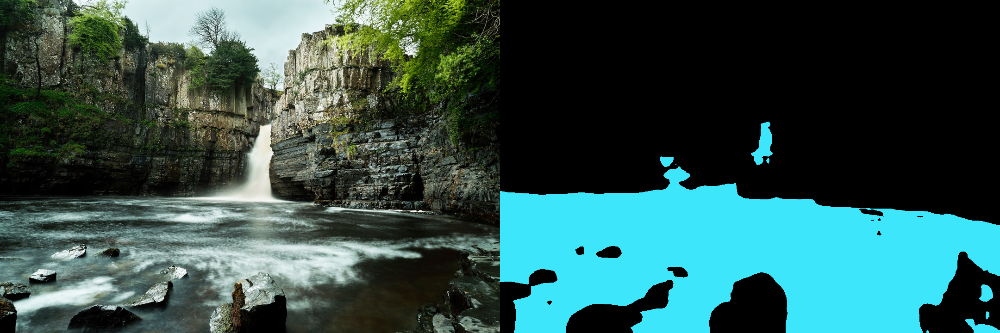

tree:


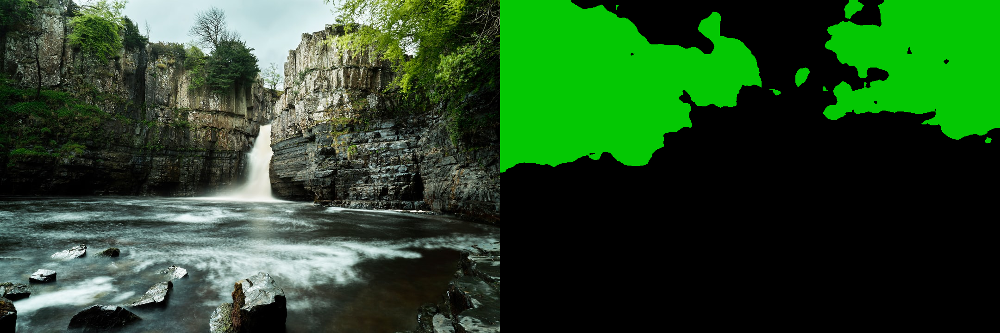

rock:


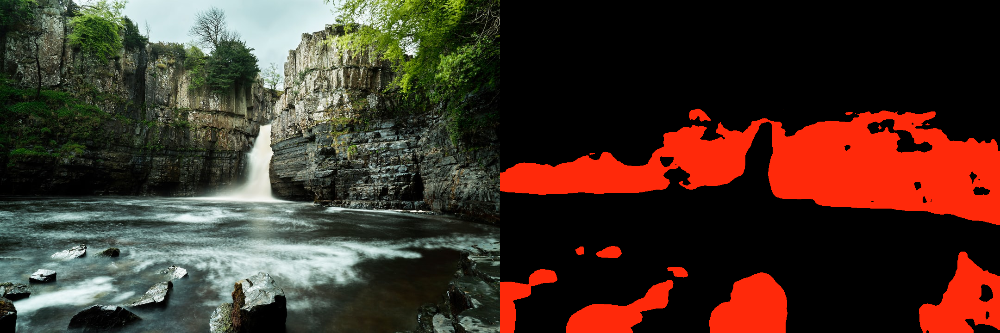

sky:


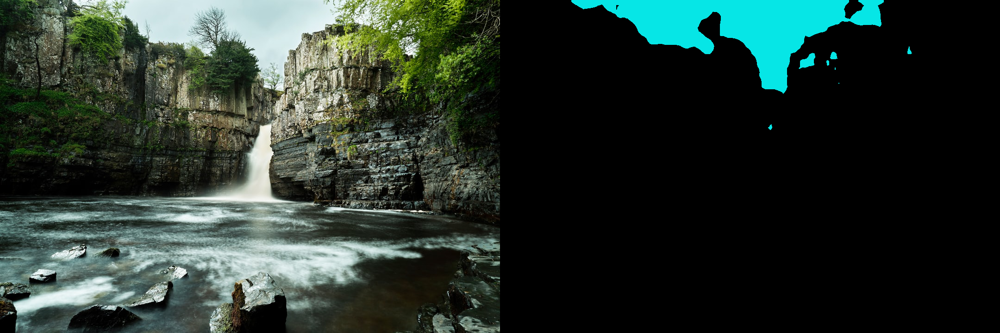

mountain:


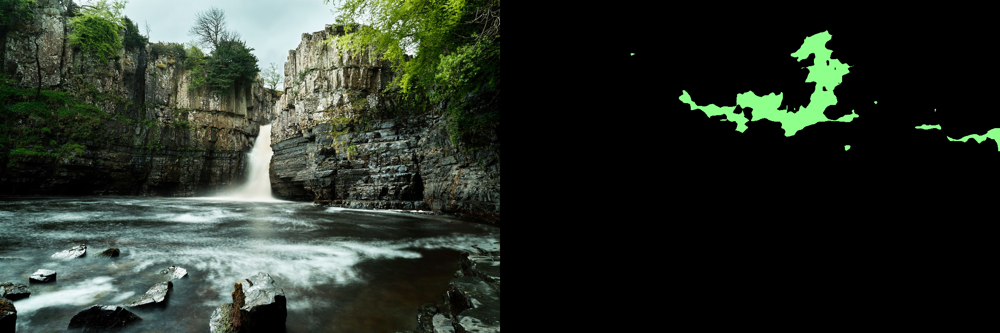

In [61]:
predicted_classes = numpy.bincount(pred.flatten()).argsort()[::-1]
for c in predicted_classes[:5]:
    visualize_result(img_original, pred, c)

In [65]:
for r in results[:5]:
    print(numpy.load(r).shape)

(1620, 1080)
(720, 1080)
(720, 1080)
(1441, 1080)
(608, 1080)


In [67]:
height, width = pred.shape

In [163]:
analysed_image_tiles = []
tiles_y, tiles_x = (6, 12)
move_y = int(height / tiles_y)
move_x = int(height / tiles_x)
for i in range(tiles_y):
    for j in range(tiles_x):
        start_y = i * move_y
        start_x = j * move_x
        analysed_image = {}
        analysed_image['width'] = move_x
        analysed_image['height'] = move_y
        analysed_image['tile_x'] = j
        analysed_image['tile_y'] = i
        analysed_image['class_int'] = numpy.bincount(pred[start_y:start_y + move_y, start_x:start_x + move_x].flatten()).argmax()
        analysed_image['class'] = get_class(analysed_image['class_int'])
        analysed_image_tiles.append(analysed_image)
        
analysed_image_tiles

[{'width': 1,
  'height': 2,
  'tile_x': 0,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
  'tile_x': 1,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
  'tile_x': 2,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
  'tile_x': 3,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
  'tile_x': 4,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
  'tile_x': 5,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
  'tile_x': 6,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
  'tile_x': 7,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
  'tile_x': 8,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
  'tile_x': 9,
  'tile_y': 0,
  'class_int': 4,
  'class': 'tree'},
 {'width': 1,
  'height': 2,
 

In [164]:
for tile in analysed_image_tiles:
    print(tile['class'])
    width = tile['width']
    height = tile['height']
    start_x = tile['tile_x'] * width
    start_y = tile['tile_y'] * height
    display(PIL.Image.fromarray(img_original[start_y:start_y + height, start_x:start_x + width,:]))

tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree


tree
